# SKW Binary Segmentation Training

Train a U-Net segmentation model on the SKW drone dataset.

- 434 images (792x792) — YOLO bbox labels rasterized into binary masks
- Pretrained ImageNet encoder via segmentation-models-pytorch
- Dice + CE combined loss for class-imbalanced binary segmentation
- Measures foreground IoU (JaccardCoeffMulti) and Dice

In [1]:
import sys

import torch
from pathlib import Path
from fastai.vision.all import *
from safetensors.torch import save_file
import segmentation_models_pytorch as smp

sys.path.insert(0, str(Path.cwd().parent))
sys.path.insert(0, str(Path.cwd()))

In [2]:
from dataset import build_seg_dataloaders
from loss import DiceCenterWeightedCELoss
from metrics import ForegroundIoU, SegDiceMulti
from augs import GeometricSegAugCallback

from shared.data import parse_splits
from shared.helpers import print_system_info
from shared.augs import (
    RandomRectangle,
    RandomSharpenBlur,
    ImageAugmentationCallback,
    DynamicZScoreNormalize,
)

from detection.helpers import plot_channel_histograms

In [3]:
print_system_info()

System Information
-----------------------------------
PyTorch Version : 2.10.0+cu128
CUDA Available  : Yes
CUDA Version    : 12.8
Python Version  : 3.13.7
Fastai Version  : 2.8.7
Default Device  : cuda:0
Device Name     : NVIDIA GeForce RTX 4090
-----------------------------------


In [4]:
# Configuration
model_type = "convnextv2_nano.fcmae_ft_in1k"
model_version = "SKW_SEG"
#########################
use_bf16 = True
#########################
img_size = 800  # must be divisible by 32
#########################
batch_size = 6
gradient_accumulation_batch_size = 16
learning_rate = 0.00008
epoch_count = 10
#########################
center_weight_max = 5.0  # CE weight at bbox center (fades to 1.0 at edges)
#########################
data_dir = Path("/media/nick/4TB Working 7/Datasets/SKW")
#########################
assert data_dir.exists(), f"Dataset not found: {data_dir}"

In [5]:
from collections import Counter

split_map = parse_splits(data_dir)
counts = Counter(split_map.values())
print(
    f"Train: {counts.get('train', 0)}, Val: {counts.get('val', 0)}, Test: {counts.get('test', 0)}"
)
print(f"Total: {sum(counts.values())}")

Train: 387, Val: 45, Test: 2
Total: 434


In [6]:
dls = build_seg_dataloaders(
    data_dir=data_dir,
    img_size=img_size,
    bs=batch_size,
    num_workers=8,
    max_weight=center_weight_max,
)

Train images: 389, Val images: 45


In [7]:
# Inspect a training batch
batch = next(iter(dls.train))
images, masks, weight_maps = batch
print(f"Image shape: {images.shape}")
print(f"Mask shape:  {masks.shape}")
print(f"Weight map shape: {weight_maps.shape}")
print(f"Mask unique values: {masks.unique().tolist()}")
print(f"Foreground pixel ratio: {masks.float().mean():.4f}")
print(f"Weight range: [{weight_maps.min().item():.2f}, {weight_maps.max().item():.2f}]")
print(f"Image dtype: {images.dtype}")
print(f"Image range: [{images.min().item():.3f}, {images.max().item():.3f}]")

Image shape: torch.Size([6, 3, 800, 800])
Mask shape:  torch.Size([6, 800, 800])
Weight map shape: torch.Size([6, 800, 800])
Mask unique values: [0, 1]
Foreground pixel ratio: 0.1861
Weight range: [1.00, 5.00]
Image dtype: torch.float32
Image range: [0.000, 1.000]


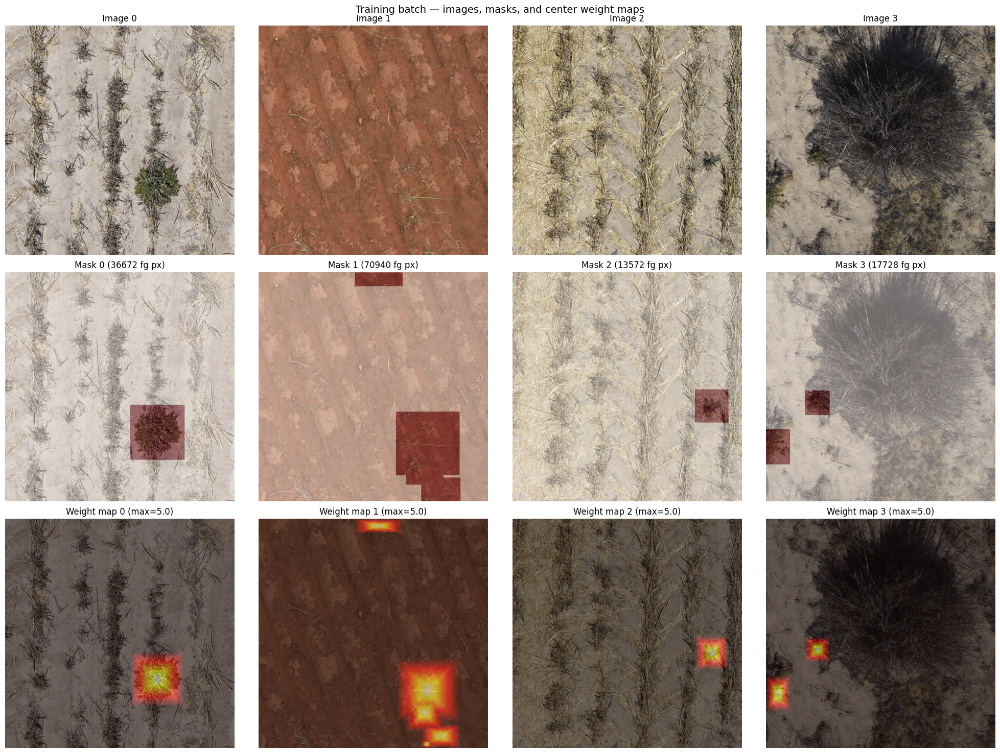

In [8]:
# Visualize batch: images with mask overlay and center weight maps
n_show = min(4, images.shape[0])
fig, axes = plt.subplots(3, n_show, figsize=(5 * n_show, 15))
for i in range(n_show):
    img = images[i].cpu().numpy().transpose(1, 2, 0)
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)
    mask = masks[i].cpu().numpy()
    wmap = weight_maps[i].cpu().numpy()

    axes[0, i].imshow(img)
    axes[0, i].set_title(f"Image {i}")
    axes[0, i].axis("off")

    axes[1, i].imshow(img)
    axes[1, i].imshow(mask, alpha=0.4, cmap="Reds")
    axes[1, i].set_title(f"Mask {i} ({mask.sum()} fg px)")
    axes[1, i].axis("off")

    axes[2, i].imshow(img)
    axes[2, i].imshow(wmap, alpha=0.5, cmap="hot", vmin=1.0, vmax=wmap.max())
    axes[2, i].set_title(f"Weight map {i} (max={wmap.max():.1f})")
    axes[2, i].axis("off")
fig.suptitle("Training batch — images, masks, and center weight maps", fontsize=14)
plt.tight_layout()
plt.show()

In [9]:
model = smp.Unet(
    encoder_name=f"tu-{model_type.split('.')[0]}",
    encoder_weights="imagenet",
    in_channels=3,
    classes=2,  # background + foreground
)

In [10]:
# Verify forward pass
dummy = torch.randn(2, 3, img_size, img_size)
out = model(dummy)
print(f"Output shape: {out.shape}")
assert out.shape == (2, 2, img_size, img_size), (
    f"Expected (2, 2, {img_size}, {img_size})"
)

Output shape: torch.Size([2, 2, 800, 800])


In [12]:
image_augs = [
    RandomRectangle(p=0.3, sl=0.05, sh=0.4),
    RandomSharpenBlur(min_factor=0.5, max_factor=1.5),
    # DynamicMinMaxNormalize(),
    DynamicZScoreNormalize(target_mean=0.0, target_std=1.0),
]

callbacks = [
    # MosaicSegCallback(p=0.2),
    ImageAugmentationCallback(image_augs),
    GeometricSegAugCallback(flip_p=0.5, rot90_p=0.5),
    ShowGraphCallback(),
    GradientAccumulation(gradient_accumulation_batch_size),
    # GradientClip(max_norm=10.0),
    SaveModelCallback(
        monitor="fg_iou",
    ),
]

Image stats (800x800)
Channel          Mean        Std        Min        Max
----------------------------------------------------
Red            0.0000     1.0000    -4.3032     2.1577
Green          0.0000     1.0000    -4.1118     2.4484
Blue          -0.0000     1.0000    -3.7945     2.5760
----------------------------------------------------
All.......    -0.0000     1.0000    -4.3032     2.5760


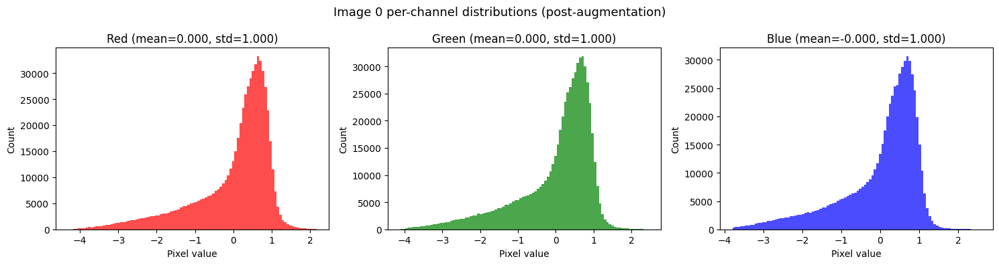

In [13]:
# Apply augmentations manually to visualize what the model sees
from fastai.torch_core import TensorImage

aug_images = TensorImage(images.clone())
for tfm in image_augs:
    if hasattr(tfm, "before_call"):
        tfm.before_call((aug_images, None), 0)
    if hasattr(tfm, "do") and not tfm.do:
        continue
    aug_images = TensorImage(tfm.encodes(TensorImage(aug_images)))

plot_channel_histograms(
    aug_images[0], title="Image 0 per-channel distributions (post-augmentation)"
)

In [14]:
# ForegroundIoU imported from metrics.py

learner = Learner(
    dls=dls,
    model=model,
    loss_func=DiceCenterWeightedCELoss(
        dice_weight=10.0,
        ce_weight=1.0,
        # class_weights=[4.0, 1.0]
    ),
    metrics=[SegDiceMulti(), ForegroundIoU()],
    cbs=callbacks,
)

In [16]:
if use_bf16:
    learner = learner.to_bf16()

In [17]:
# 53

epoch,train_loss,valid_loss,seg_dice_multi,fg_iou,time
0,9.647259,9.334939,0.424800,0.097118,00:26
1,9.019019,8.209253,0.667830,0.271455,00:17
2,8.123750,6.822401,0.820443,0.509769,00:17
3,7.263867,6.570060,0.847735,0.569672,00:17
4,6.636147,6.318966,0.829230,0.533170,00:17
5,6.198595,6.076023,0.854233,0.580711,00:17
6,5.806214,6.138741,0.855359,0.581966,00:17
7,5.594727,6.083621,0.849581,0.567071,00:17
8,5.471409,5.898129,0.863116,0.598694,00:17
9,5.412967,5.925519,0.864240,0.601612,00:17


Better model found at epoch 0 with fg_iou value: 0.09711766215877284.


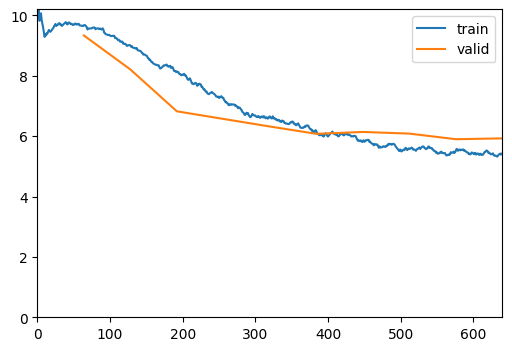

Better model found at epoch 1 with fg_iou value: 0.2714549111632585.
Better model found at epoch 2 with fg_iou value: 0.5097686689677303.
Better model found at epoch 3 with fg_iou value: 0.5696715433455093.
Better model found at epoch 5 with fg_iou value: 0.5807105276136675.
Better model found at epoch 6 with fg_iou value: 0.5819661855266995.
Better model found at epoch 8 with fg_iou value: 0.5986941925139049.
Better model found at epoch 9 with fg_iou value: 0.6016118660921446.


In [18]:
learner.fit_one_cycle(
    n_epoch=epoch_count,
    lr_max=learning_rate,
)

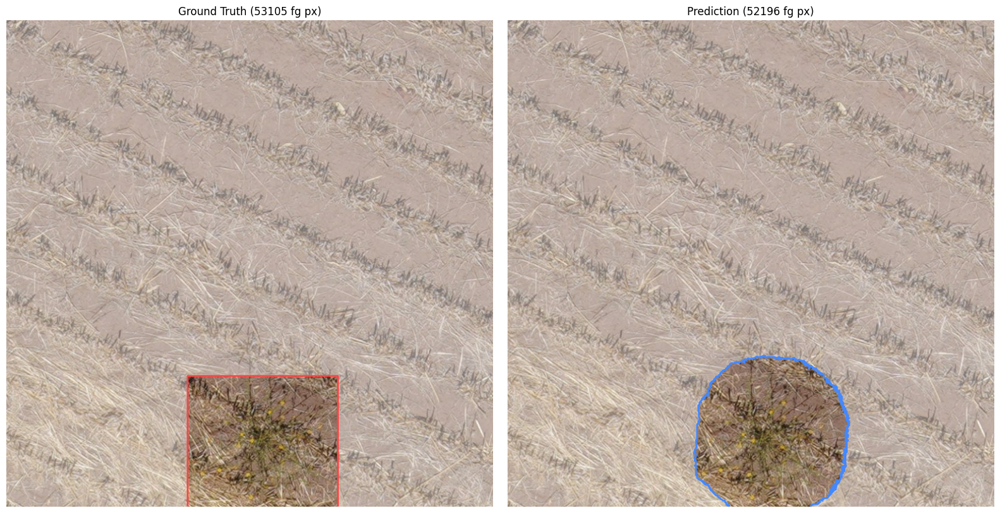

Image 0: GT 53105 fg px, Pred 52196 fg px


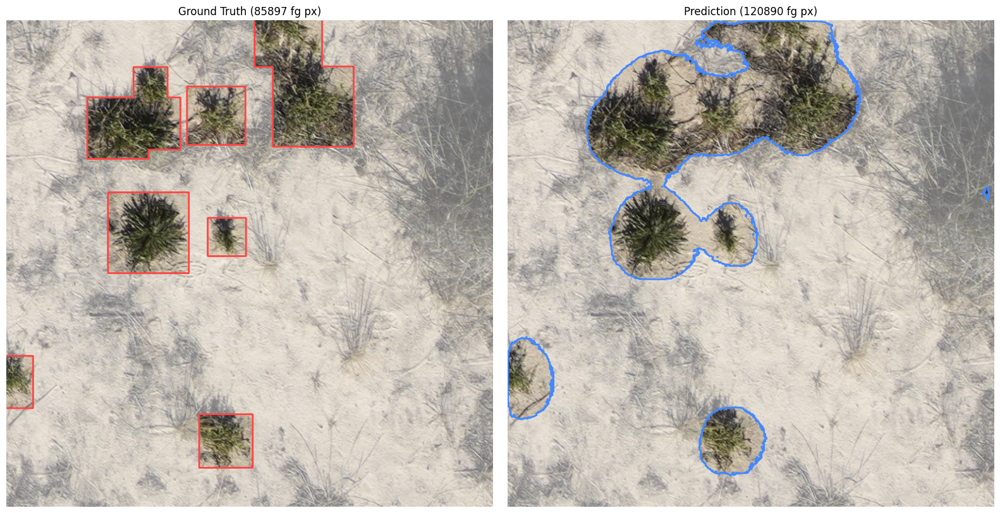

Image 1: GT 85897 fg px, Pred 120890 fg px


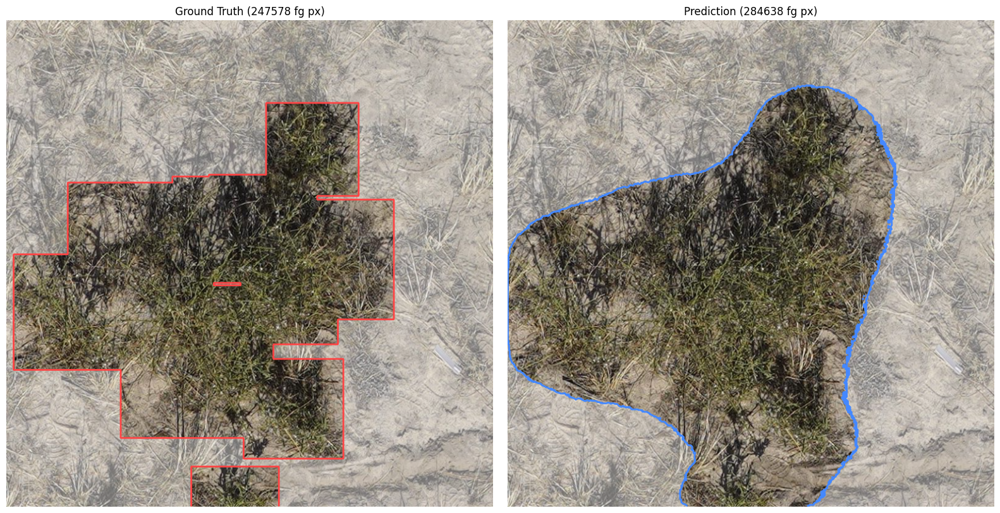

Image 2: GT 247578 fg px, Pred 284638 fg px


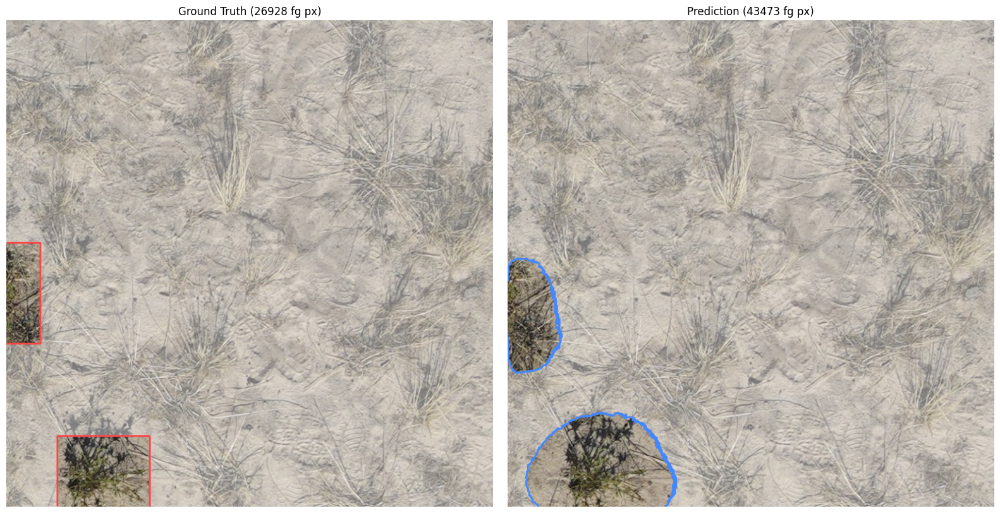

Image 3: GT 26928 fg px, Pred 43473 fg px


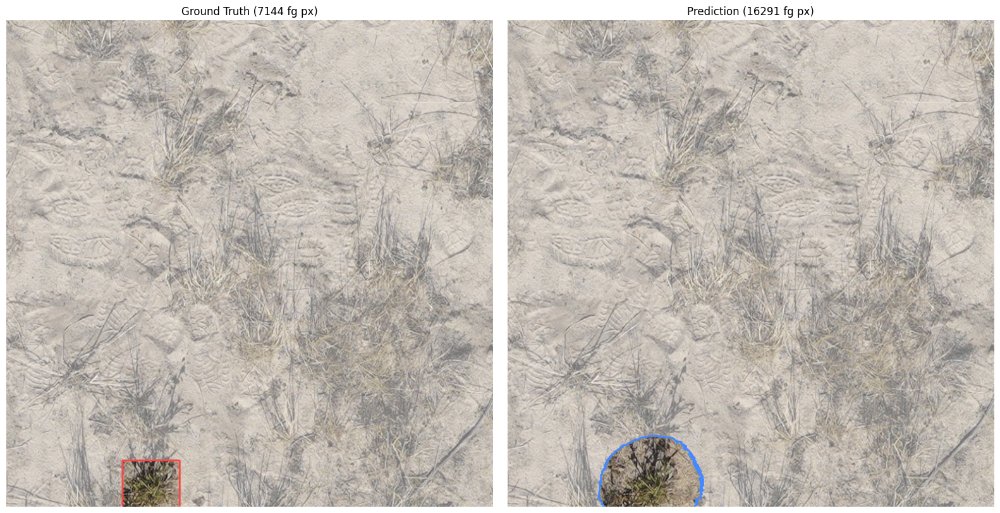

Image 4: GT 7144 fg px, Pred 16291 fg px


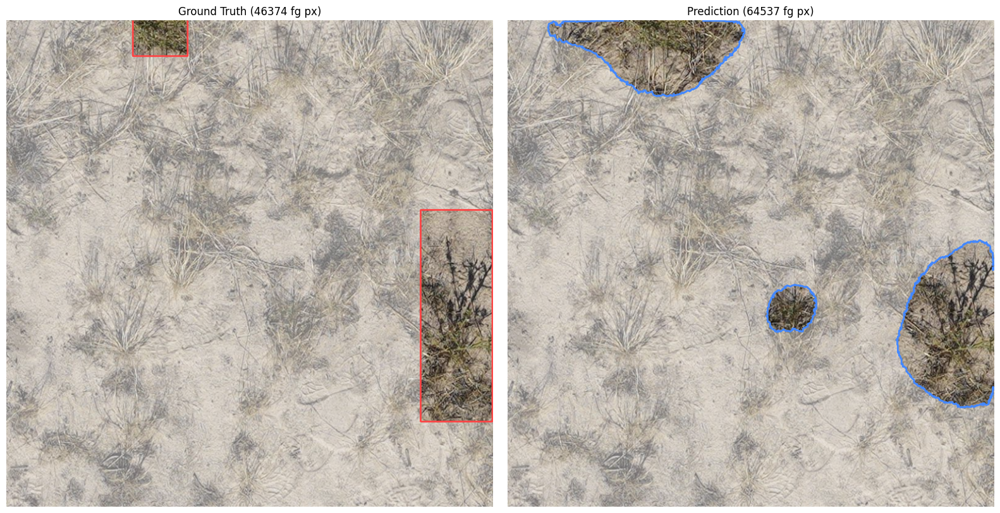

Image 5: GT 46374 fg px, Pred 64537 fg px


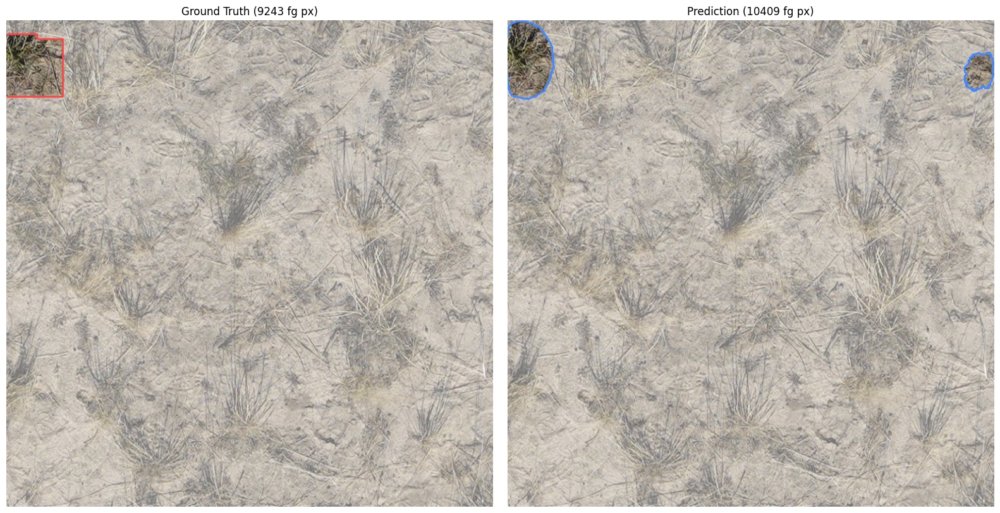

Image 6: GT 9243 fg px, Pred 10409 fg px


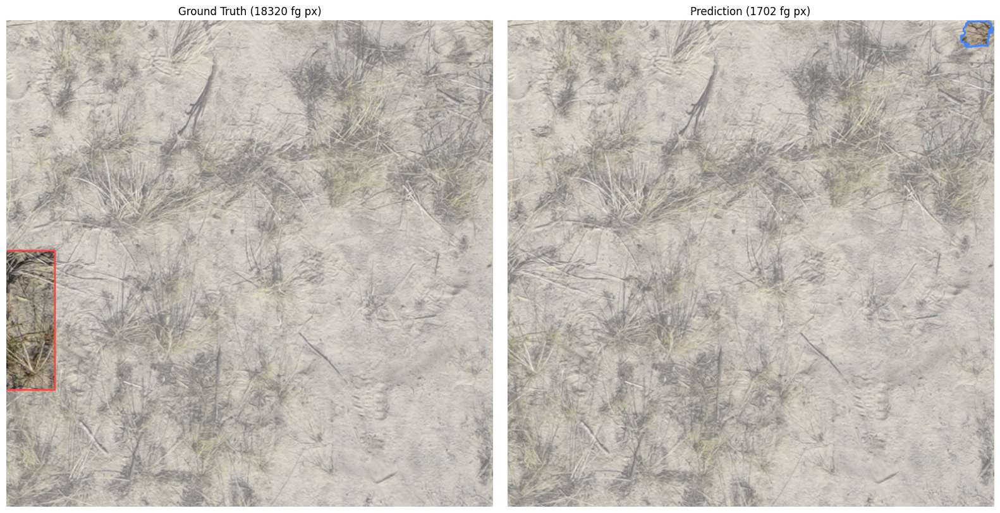

Image 7: GT 18320 fg px, Pred 1702 fg px


In [19]:
# Visualize predictions on validation images
n_images = 8  # number of images to show

model = learner.model.cuda().float()
model.eval()

# Collect images across multiple batches
all_images, all_gt, all_pred = [], [], []
val_iter = iter(dls.valid)
while len(all_images) < n_images:
    try:
        val_images, val_masks, _val_weights = next(val_iter)
    except StopIteration:
        break
    with torch.no_grad():
        logits = model(val_images.cuda().float())
        preds = logits.argmax(dim=1).cpu()
    for i in range(val_images.shape[0]):
        if len(all_images) >= n_images:
            break
        all_images.append(val_images[i])
        all_gt.append(val_masks[i])
        all_pred.append(preds[i])

for img_idx in range(len(all_images)):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

    img = all_images[img_idx].cpu().float().numpy().transpose(1, 2, 0)
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)
    gt = all_gt[img_idx].cpu().numpy()
    pred = all_pred[img_idx].numpy()

    # White overlay on background, clear foreground, contour at boundary
    bg_overlay = np.ones_like(img)  # white

    # Ground truth (left)
    ax1.imshow(img)
    ax1.imshow(bg_overlay, alpha=np.where(gt == 0, 0.4, 0.0))
    if gt.max() > 0:
        ax1.contour(gt, levels=[0.5], colors=["#FF4444"], linewidths=2)
    ax1.set_title(f"Ground Truth ({gt.sum()} fg px)")
    ax1.axis("off")

    # Prediction (right)
    ax2.imshow(img)
    ax2.imshow(bg_overlay, alpha=np.where(pred == 0, 0.4, 0.0))
    if pred.max() > 0:
        ax2.contour(pred, levels=[0.5], colors=["#4488FF"], linewidths=2)
    ax2.set_title(f"Prediction ({pred.sum()} fg px)")
    ax2.axis("off")

    plt.tight_layout()
    plt.show()
    print(f"Image {img_idx}: GT {gt.sum()} fg px, Pred {pred.sum()} fg px")